In [220]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import contextily as ctx
import geoplot as gplt
import os
sns.set_style("darkgrid")
pd.set_option('max_columns', 30)
pd.set_option('display.max_colwidth', 200)

In [221]:
final_LDA_df = pd.read_csv(r'D:\Python ML\Envelope-key-words\Data\Processed\Envelope_modelled_topics_20201127.csv').drop(['Unnamed: 0'], axis=1)

In [222]:
final_LDA_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5894 entries, 0 to 5893
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   5894 non-null   object 
 1   Category             5894 non-null   object 
 2   Title                5894 non-null   object 
 3   Publication Date     5630 non-null   object 
 4   Format               5886 non-null   object 
 5   Broad Subject        5892 non-null   object 
 6   Notes                2753 non-null   object 
 7   Tenement             5465 non-null   object 
 8   normalised_Abstract  5894 non-null   object 
 9   Abstract_toks        5894 non-null   object 
 10  Abstract_len         5894 non-null   int64  
 11  Dominant_Topic       5894 non-null   float64
 12  Percent_Contrib      5894 non-null   float64
 13  Topic_keywords       5894 non-null   object 
 14  Topic_Name           5894 non-null   object 
 15  Relevent_words       5894 non-null   o

In [223]:
final_LDA_df.sample(3)

,ID,Category,Title,Publication Date,Format,Broad Subject,Notes,Tenement,normalised_Abstract,Abstract_toks,Abstract_len,Dominant_Topic,Percent_Contrib,Topic_keywords,Topic_Name,Relevent_words
1864,ENV03994,Company mineral exploration licence reports,"Fiddle Hill. Progress reports to licence expiry/full surrender, for the period 4/9/1980 to 3/9/1982.",Dec-82,Digital Hard Copy,Mineral exploration - SA;Geophysics;Drilling;Geochemistry;Petrology,"Same area has been retained by Afmeco as EL 1082. Includes: - Dockery, B.A., May 1981. Review of aeromagnetic surveys, Lake Hart, Kangaroo Bluff and Fiddle Hill prospects, South Australia (geophys...",EL00713,target olympic dam style cu au mineralisation lie linear gravity feature extend south lake macfarlane associate magnetic discontinuity unconformity relate sedimentary pandurra formation gawler ran...,"['target', 'olympic', 'dam', 'style', 'cu', 'au', 'mineralisation', 'lie', 'linear', 'gravity', 'feature', 'extend', 'south', 'lake', 'macfarlane', 'associate', 'magnetic', 'discontinuity', 'uncon...",105,1.0,0.7116,gravity' anomaly' survey' magnetic' datum' basement' km' target' area' drill,IOCG exploration,"['gravity', 'basement', 'magnetic', 'iocg', 'anomaly', 'datum', 'el', 'target', 'depth', 'geophysical', 'km', 'survey', 'olympic_dam', 'acquire', 'station', 'station_read', 'interpret', 'drill', '..."
3609,ENV09172,Company mineral exploration licence reports,Mount Dare (Mount Barr East). Final report for the period 13/10/94 to July 1996.,Aug-96,Digital Hard Copy,Mineral exploration - SA;Geochemistry,NaN,EL02025,encourage value detect loam sample take one ten aeromagnetic feature possible kimberlitic affinity locate near mount dare station north disused pedirka railway siding,"['encourage', 'value', 'detect', 'loam', 'sample', 'take', 'one', 'ten', 'aeromagnetic', 'feature', 'possible', 'kimberlitic', 'affinity', 'locate', 'near', 'mount', 'dare', 'station', 'north', 'd...",23,7.0,0.9042,magnetic' survey' diamond' anomaly' foot' sampling' ground' area' kimberlite' exploration,Diamond exploration,"['kimberlite', 'foot', 'mineralization', 'indicator_mineral', 'kimberlitic', 'aerial', 'diamond', 'loam', 'kimberlite_indicator_mineral', 'grain', 'fdl', 'cattlegrid', 'microdiamond', 'kimberlitic..."
4338,ENV10431,Company mineral exploration licence reports,"Lake Gilles (part of the Wilcherry Hill Project). First and second partial relinquishment reports, for the period 10/10/2002 to 9/10/2004.",15-Nov-04,Digital Hard Copy,Mineral exploration - SA;Geochemistry;Geophysics;Remote sensing,NaN,EL03020,exploration economic near surface deposit gold base metal area possibly hydrothermally alter hiltaba suite mesoproterozoic basement locate approximately km north kimba comprise assessment previous...,"['exploration', 'economic', 'near', 'surface', 'deposit', 'gold', 'base', 'metal', 'area', 'possibly', 'hydrothermally', 'alter', 'hiltaba', 'suite', 'mesoproterozoic', 'basement', 'locate', 'appr...",87,2.0,0.5295,gold' sample' mineralisation' hole' copper' area' prospect' drilling' sampling' rock,"Gold, copper, base metal exploration","['gold', 'soil', 'sample', 'rock_chip', 'copper', 'value', 'sampling', 'au', 'base_metal', 'mineralisation', 'anomalous', 'geochemical', 'return', 'assay', 'vein', 'prospect', 'ppm', 'zone', 'bedr..."


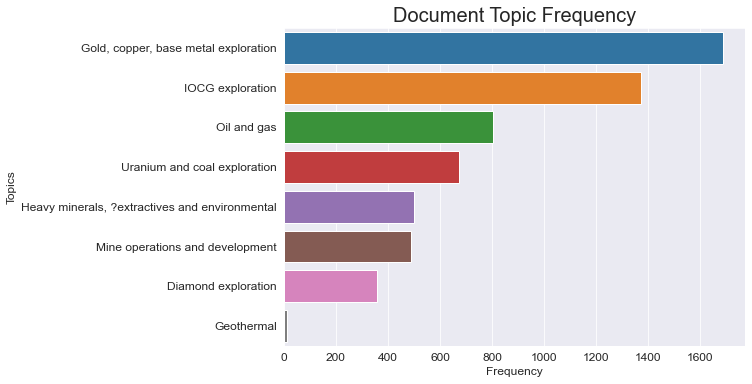

In [224]:
topic_counts = final_LDA_df['Topic_Name'].value_counts()
plt.figure(figsize=(8.27,11.69/2))
sns.barplot(topic_counts, topic_counts.index)
plt.title("Document Topic Frequency", fontsize=20)
plt.ylabel('Topics', fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('Frequency', fontsize=12)
plt.xticks(fontsize=12)
plt.savefig(r"D:\Python ML\Envelope-key-words\Notebooks\Abstract LDA\Figures\Doc_topic_Freq.png", bbox_inches='tight')
plt.show()

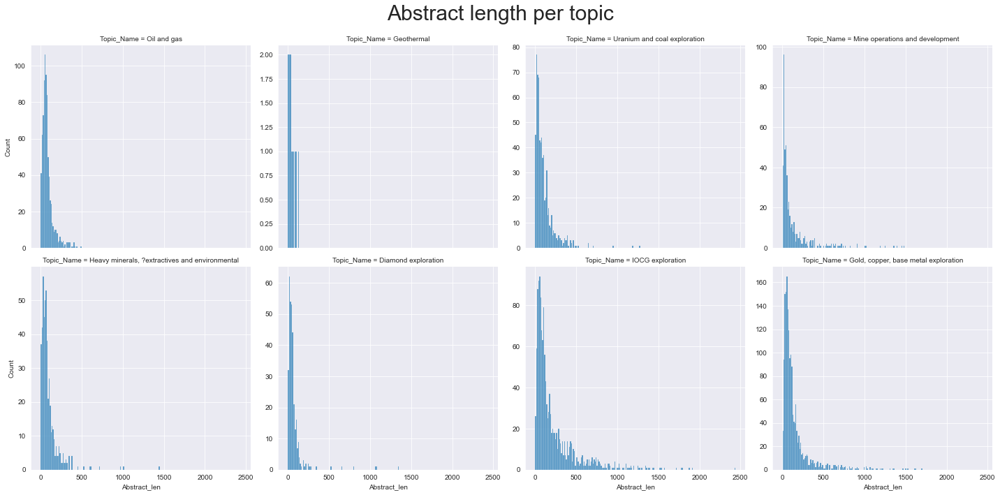

In [225]:
sns.displot(final_LDA_df, x= 'Abstract_len', col= 'Topic_Name', col_wrap=4, facet_kws={'sharey':False})
plt.subplots_adjust(top=0.9)
plt.suptitle("Abstract length per topic", fontsize=30)
plt.show()

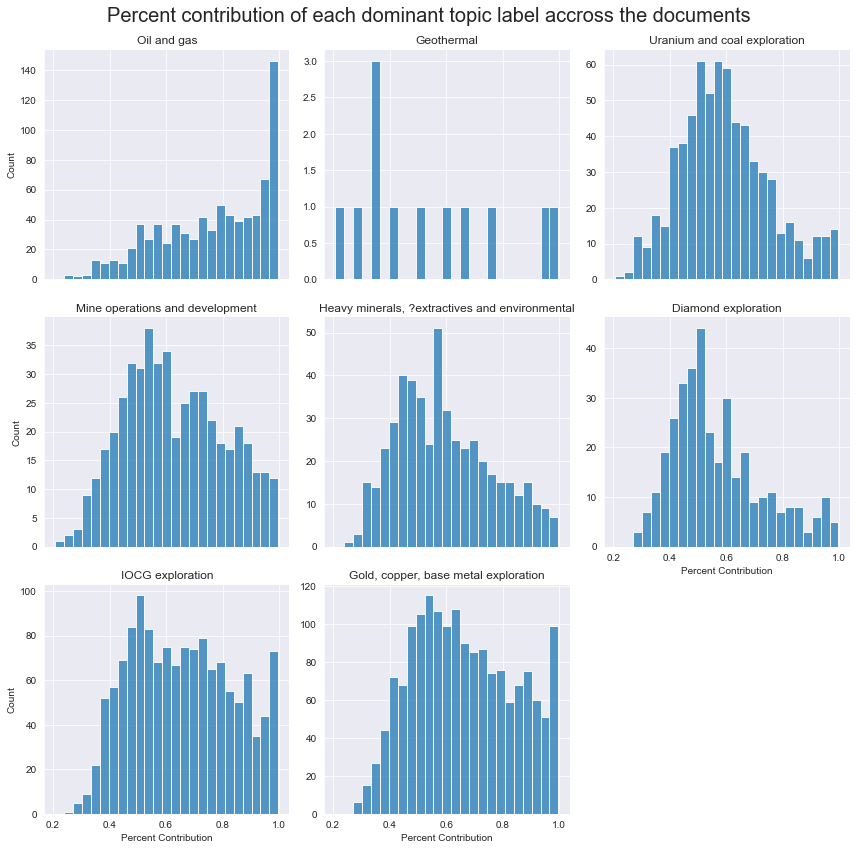

In [226]:
g = sns.displot(final_LDA_df, x= 'Percent_Contrib', col= 'Topic_Name', col_wrap=3,height=4, facet_kws={'sharey':False})
plt.subplots_adjust(top=0.93)
plt.suptitle("Percent contribution of each dominant topic label accross the documents", fontsize=20)
g.set_xlabels('Percent Contribution', fontsize=10)
g.set_ylabels(fontsize=10)
g.set_titles("{col_name}", size=12)
g.savefig(r"D:\Python ML\Envelope-key-words\Notebooks\Abstract LDA\Figures\Percent_contribution.png")
plt.show()

## Review existing document categorys and see how they align with the derrived topics

Because the provided categorys contain a number of simmilar categorys, we first map then to a consistent list of distinct categorys

In [227]:
print(final_LDA_df['Category'].unique())

['Company petroleum exploration licence reports' 'DSD publications'
 'Non-DSD publications, theses and miscellaneous reports'
 'Company mineral exploration licence reports' 'Departmental publications'
 'External publications, theses and miscellaneous reports'
 'Company mining program' 'Mineral Production Licence report'
 'Geothermal exploration licence reports']


In [228]:
category_map = {'Company petroleum exploration licence reports':'Petroleum Exploration Publications', 'DSD publications':'Departmental Publications',
 'Non-DSD publications, theses and miscellaneous reports':'Theses and non-dept miscellaneous reports',
 'Company mineral exploration licence reports':'Mineral Exploration Publications', 'Departmental publications': 'Departmental Publications',
 'External publications, theses and miscellaneous reports': 'Theses and non-dept miscellaneous reports',
 'Company mining program':'Mining Publications', 'Mineral Production Licence report':'Mining Publications',
 'Geothermal exploration licence reports':'Geothermal Publications'}

In [229]:
final_LDA_df['normalised_category'] = final_LDA_df['Category'].map(category_map)

In [230]:
final_LDA_df.sample(2)

,ID,Category,Title,Publication Date,Format,Broad Subject,Notes,Tenement,normalised_Abstract,Abstract_toks,Abstract_len,Dominant_Topic,Percent_Contrib,Topic_keywords,Topic_Name,Relevent_words,normalised_category
4896,ENV11689,Geothermal exploration licence reports,2007 Callabonna Magnetotelluric survey - GEL 157.,Dec-08,Digital,Geophysics;Alternative Energy,NaN,GEL00157,petratherm contract quantec geoscience pty ltd record callabonna magneto telluric survey december purpose survey determine depth basement thus determine potential area host geothermal resource tot...,"['petratherm', 'contract', 'quantec', 'geoscience', 'pty', 'ltd', 'record', 'callabonna', 'magneto', 'telluric', 'survey', 'december', 'purpose', 'survey', 'determine', 'depth', 'basement', 'thus'...",114,1.0,0.5220,gravity' anomaly' survey' magnetic' datum' basement' km' target' area' drill,IOCG exploration,"['gravity', 'basement', 'magnetic', 'iocg', 'anomaly', 'datum', 'el', 'target', 'depth', 'geophysical', 'km', 'survey', 'olympic_dam', 'acquire', 'station', 'station_read', 'interpret', 'drill', '...",Geothermal Publications
727,ENV01637,Company mineral exploration licence reports,Wadnaminga. Progress reports to licence expiry for the period 1/4/1971 to 31/3/1972.,Apr-72,Hard Copy Digital,Mineral exploration - SA;Geochemistry;Petrology;Structural geology;Metamorphism;Mines,NaN,SML00556,exploration possible economic base metal gold occurrence anabama area comprise semi detailed geological mapping scale rock chip sampling sample regional infill stream sediment sampling sample petr...,"['exploration', 'possible', 'economic', 'base', 'metal', 'gold', 'occurrence', 'anabama', 'area', 'comprise', 'semi', 'detailed', 'geological', 'mapping', 'scale', 'rock', 'chip', 'sampling', 'sam...",64,2.0,0.9838,gold' sample' mineralisation' hole' copper' area' prospect' drilling' sampling' rock,"Gold, copper, base metal exploration","['gold', 'soil', 'sample', 'rock_chip', 'copper', 'value', 'sampling', 'au', 'base_metal', 'mineralisation', 'anomalous', 'geochemical', 'return', 'assay', 'vein', 'prospect', 'ppm', 'zone', 'bedr...",Mineral Exploration Publications


In [231]:
final_LDA_df['normalised_category'].value_counts()

Mineral Exploration Publications             4597
Petroleum Exploration Publications            911
Departmental Publications                     167
Theses and non-dept miscellaneous reports     137
Geothermal Publications                        76
Mining Publications                             6
Name: normalised_category, dtype: int64

In [232]:
mining_pubs = final_LDA_df[final_LDA_df['normalised_category'] == 'Mining Publications']
geothermal_pubs = final_LDA_df[final_LDA_df['normalised_category'] == 'Geothermal Publications']

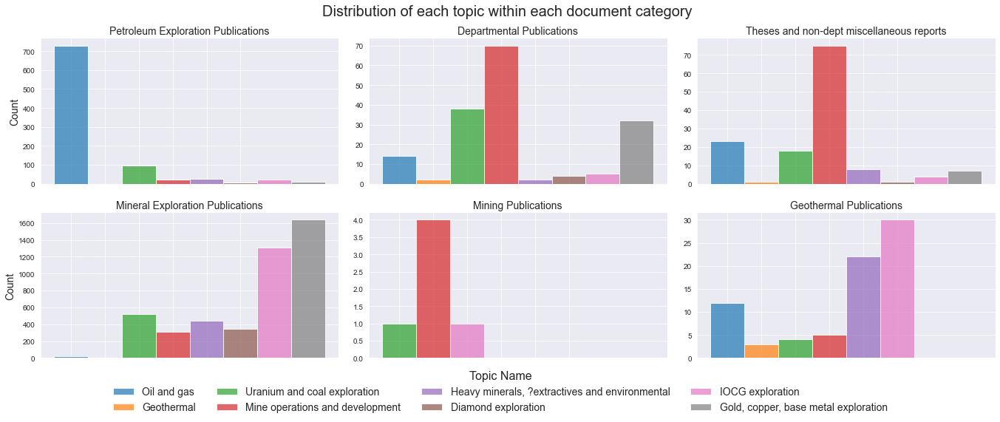

In [233]:
g = sns.FacetGrid(final_LDA_df, col="normalised_category", hue="Topic_Name",col_wrap=3, height=4, aspect=0.4, sharey=False)
g.map(sns.histplot, "Topic_Name", alpha=0.7)
g.add_legend(loc='lower center', ncol=4, prop={'size':14}, title='Topic Name')
plt.subplots_adjust(top=0.90, bottom=0.15, left=0.05, right=0.97, wspace=0.1, hspace=0.2)
plt.suptitle("Distribution of each topic within each document category", fontsize=20)
g.set_xticklabels([])
g.set_xlabels('',fontsize=14)
g.set_ylabels('Count',fontsize=14)
g.set_titles("{col_name}", size=14)
g.legend.get_title().set_fontsize('16')

#g.tight_layout()
plt.savefig(r"D:\Python ML\Envelope-key-words\Notebooks\Abstract LDA\Figures\Doc_classes_v_topic.png")
plt.show()

# Tenements

In [234]:
tenements_df = final_LDA_df[['ID', 'Tenement','Dominant_Topic','Topic_Name']]

In [235]:
tenements_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5894 entries, 0 to 5893
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   ID              5894 non-null   object 
 1   Tenement        5465 non-null   object 
 2   Dominant_Topic  5894 non-null   float64
 3   Topic_Name      5894 non-null   object 
dtypes: float64(1), object(3)
memory usage: 184.3+ KB


In [236]:
tenements_df.sample(20)

,ID,Tenement,Dominant_Topic,Topic_Name
3121,ENV08361,EL01682;EL02203,0.0,Uranium and coal exploration
5640,ENV12743,EL05440,6.0,"Heavy minerals, ?extractives and environmental"
5733,ENV12872,GEL00503;GEL00504;GEL00505;GEL00506;GEL00507,6.0,"Heavy minerals, ?extractives and environmental"
4390,ENV10637,EL03080;EL03097;EL03308;EL04161;EL04165;EL04523,1.0,IOCG exploration
4801,ENV11553,EL03512,1.0,IOCG exploration
3524,ENV09065,EL02089,1.0,IOCG exploration
5592,ENV12672,PEL00104;PEL00111,5.0,Oil and gas
760,ENV01672,SML00573,7.0,Diamond exploration
4468,ENV11091,EL03278,4.0,Mine operations and development
3065,ENV08265,EL01630,6.0,"Heavy minerals, ?extractives and environmental"


In [237]:
tenements_df['Tenement'] = tenements_df['Tenement'].str.split(';')
tenements_df['most_recent_tenement'] = tenements_df.Tenement.str[-1]
tenements_df.tail(10)

,ID,Tenement,Dominant_Topic,Topic_Name,most_recent_tenement
5884,ENV13182,[EL05931],1.0,IOCG exploration,EL05931
5885,ENV13183,"[EL05349, EL06291]",6.0,"Heavy minerals, ?extractives and environmental",EL06291
5886,ENV13184,[PPL00062],4.0,Mine operations and development,PPL00062
5887,ENV13185,"[EL02593, EL03221, EL04388, EL05542]",6.0,"Heavy minerals, ?extractives and environmental",EL05542
5888,ENV13187,"[EL04263, EL05419]",2.0,"Gold, copper, base metal exploration",EL05419
5889,ENV13201,"[EL02692, EL03346, EL04597, EL05773]",2.0,"Gold, copper, base metal exploration",EL05773
5890,ENV13202,"[EL02392, EL02991, EL03937, EL05234, EL06132]",2.0,"Gold, copper, base metal exploration",EL06132
5891,ENV9267,NaN,2.0,"Gold, copper, base metal exploration",NaN
5892,ENV9267,"[PEL00005, PEL00006, PPL00010, OEL00020, OEL00021, PPL00207, PPL00006, PPL00138, PPL00090]",4.0,Mine operations and development,PPL00090
5893,ENV9267,"[OEL00020, OEL00021, PEL00005, PEL00006, PPL00014]",4.0,Mine operations and development,PPL00014


### Asses just how many multiple tenements there are in the document lists

In [238]:
all_tenements_exploded = tenements_df.explode('Tenement')
all_tenements_exploded.tail(10)

,ID,Tenement,Dominant_Topic,Topic_Name,most_recent_tenement
5892,ENV9267,OEL00021,4.0,Mine operations and development,PPL00090
5892,ENV9267,PPL00207,4.0,Mine operations and development,PPL00090
5892,ENV9267,PPL00006,4.0,Mine operations and development,PPL00090
5892,ENV9267,PPL00138,4.0,Mine operations and development,PPL00090
5892,ENV9267,PPL00090,4.0,Mine operations and development,PPL00090
5893,ENV9267,OEL00020,4.0,Mine operations and development,PPL00014
5893,ENV9267,OEL00021,4.0,Mine operations and development,PPL00014
5893,ENV9267,PEL00005,4.0,Mine operations and development,PPL00014
5893,ENV9267,PEL00006,4.0,Mine operations and development,PPL00014
5893,ENV9267,PPL00014,4.0,Mine operations and development,PPL00014


In [239]:
all_tenements_exploded['tenement_type'] = all_tenements_exploded['Tenement'].str.extract(r'(^\D{1,3})')
all_tenements_exploded['tenement_type'].value_counts()

EL     6933
SML     837
PEL     746
MC      327
ML      310
GEL     274
OEL     227
PPL     177
EPP     146
ATP      20
PE       17
PEP      16
PM       14
RL       10
MSL      10
THR       7
MPL       5
ELA       5
MR        5
PRL       5
EML       4
AAL       3
T         2
OP        1
SIP       1
FR        1
SA        1
Name: tenement_type, dtype: int64

In [240]:
# and just for the most recent temenments
tenements_df['tenement_type'] = tenements_df['most_recent_tenement'].str.extract(r'(^\D{1,3})')
tenements_df['tenement_type'].value_counts()

EL     3745
SML     615
PEL     470
OEL     171
EPP     108
ML       88
GEL      81
MC       74
PPL      63
PM       12
ATP      11
RL        5
ELA       3
PEP       3
AAL       3
MPL       3
EML       2
PRL       2
SA        1
SIP       1
OP        1
PE        1
MSL       1
T         1
Name: tenement_type, dtype: int64

In [246]:
most_recent_tenem_list = tenements_df['most_recent_tenement'].dropna().to_list()
all_tenemenents_list = all_tenements_exploded['Tenement'].dropna().to_list()

In [247]:
len(most_recent_tenem_list)

5465

In [248]:
len(all_tenemenents_list)

10109

# load spatial tenement datasets

In [249]:
surf_geol = gpd.read_file(r'D:\Python ML\Envelope-key-words\Data\2M Surface Geology_gdb\2M Surface Geology.gdb')

In [250]:
# resursively walk a dir to find and append the gdb files into a dict

tenm_path = (r'D:\Python ML\Envelope-key-words\Data\Tenement_spatial')

tenm_dict = {}
for root, dirs, files in os.walk(tenm_path):
    for dir in dirs:
        if dir.endswith(".gdb"):
            key = dir
            data = gpd.read_file(os.path.join(root,dir))
            tenm_dict[key] = data 

tenm_dict.keys()

dict_keys(['geothermal_exploration_licences.gdb', 'geothermal_exploration_licence_applications.gdb', 'Mineral Claims.gdb', 'Mineral leases.gdb', 'mineral_opal_exploration_licences.gdb', 'Miscellaneous_Purposes_Leases.gdb', 'Non_active_geothermal_exploration_licences.gdb', 'non_active_mineral_exploration_licences.gdb', 'non_active_mineral_production_tenements.gdb', 'Non_active_petroleum_exploration_licences_1945_1967.gdb', 'Non_active_petroleum_exploration_licences.gdb', 'Non_active_special_mining_licences.gdb', 'Olympic_dam.gdb', 'petroleum_exploration_licences_permits.gdb', 'petroleum_exploration_licence_permit_applications.gdb', 'petroleum_production_licences.gdb', 'Private_mines.gdb', 'Retention_leases.gdb'])

Need to go through each gdf to check which field is the correct for the labels. Unfortunately Petroleum and Minerals use different headers, plus special mining leases are different again. The tenement numbers here don't have the zero padding like they do in the index table plus have spaces. Need to add padding to make them the same and remove white space

In [251]:
tenm_dict['Retention_leases.gdb'].info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 28 entries, 0 to 27
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   OBJECTID                     28 non-null     int64   
 1   TENEMENT_TYPE                28 non-null     object  
 2   Reports_and_related_records  28 non-null     int64   
 3   TENEMENT_LABEL               28 non-null     object  
 4   TENEMENT_STATUS              28 non-null     object  
 5   TENEMENT_HOLDERS             28 non-null     object  
 6   TENEMENT_OPERATORS           28 non-null     object  
 7   LEGAL_AREA                   28 non-null     float64 
 8   AREA_UNIT                    28 non-null     object  
 9   LOCATION                     18 non-null     object  
 10  REGISTRATION_GRANT_DATE      28 non-null     object  
 11  SURRENDER_DATE               0 non-null      object  
 12  EXPIRY_DATE                  28 non-null     object  
 13 

In [252]:
tenm_dict['Retention_leases.gdb'].head(1)

,OBJECTID,TENEMENT_TYPE,Reports_and_related_records,TENEMENT_LABEL,TENEMENT_STATUS,TENEMENT_HOLDERS,TENEMENT_OPERATORS,LEGAL_AREA,AREA_UNIT,LOCATION,REGISTRATION_GRANT_DATE,SURRENDER_DATE,EXPIRY_DATE,RENEWAL_RECEIVED_DATE,TRANSFER_RECEIVED_DATE,SURRENDER_RECEIVED_DATE,COMMODITY_CATEGORIES,COMMODITIES,COURT_ACTION_PENDING,MPL_PURPOSE,OPERATION_NAME,OPERATION_STATUS,OPERATION_METHOD,SHAPE_Length,SHAPE_Area,geometry
0,1,RL,125,RL 125,Active,Iluka (Eucla Basin) Pty Ltd,Iluka (Eucla Basin) Pty Ltd,2320.0,Hectares,Approximately 105 km northwest of Ceduna,2011-04-14T00:00:00,None,2021-04-13T00:00:00,None,None,None,Gem & Semi-precious Stones;Industrial Minerals;Construction Materials;Metallic Minerals;Exploration,Sillimanite; Diamond; Sapphire; Calcrete; Staurolite; Xenotime; Rutile; Gold; Sand; Anatase; Feldspar; Kyanite; Monazite; Ilmenite; Ironstone; Granite; Garnet; Topaz; Zircon; Gravel (Natural); Leu...,No,None,Iluka (Eucla Basin),Operating,No Method Defined,0.188852,0.002203,"MULTIPOLYGON (((132.81911 -31.55883, 132.81886 -31.56965, 132.81860 -31.58047, 132.79754 -31.58011, 132.77648 -31.57975, 132.77673 -31.56893, 132.77699 -31.55811, 132.77722 -31.54857, 132.77746 -3..."


In [253]:
def tenement_label(x):
    a,b = x.split(' ')
    b = b.zfill(5)
    return a+b

In [254]:
tenm_dict['geothermal_exploration_licences.gdb']['tenement_id'] = tenm_dict['geothermal_exploration_licences.gdb'].Tenement_No.apply(tenement_label)
tenm_dict['geothermal_exploration_licence_applications.gdb']['tenement_id'] = tenm_dict['geothermal_exploration_licence_applications.gdb'].Tenement_No.apply(tenement_label)
tenm_dict['Mineral Claims.gdb']['tenement_id'] = tenm_dict['Mineral Claims.gdb'].TENEMENT_LABEL.apply(tenement_label)
tenm_dict['Mineral leases.gdb']['tenement_id'] = tenm_dict['Mineral leases.gdb'].TENEMENT_LABEL.apply(tenement_label)
tenm_dict['mineral_opal_exploration_licences.gdb']['tenement_id'] = tenm_dict['mineral_opal_exploration_licences.gdb'].TENEMENT_LABEL.apply(tenement_label)
tenm_dict['Miscellaneous_Purposes_Leases.gdb']['tenement_id'] = tenm_dict['Miscellaneous_Purposes_Leases.gdb'].TENEMENT_LABEL.apply(tenement_label)
tenm_dict['Non_active_geothermal_exploration_licences.gdb']['tenement_id'] = tenm_dict['Non_active_geothermal_exploration_licences.gdb'].Tenement_No.apply(tenement_label)
tenm_dict['non_active_mineral_exploration_licences.gdb']['tenement_id'] = tenm_dict['non_active_mineral_exploration_licences.gdb'].TENEMENT_LABEL.apply(tenement_label)
tenm_dict['non_active_mineral_production_tenements.gdb']['tenement_id'] = tenm_dict['non_active_mineral_production_tenements.gdb'].TENEMENT_LABEL.apply(tenement_label)
tenm_dict['Non_active_petroleum_exploration_licences_1945_1967.gdb']['tenement_id'] = tenm_dict['Non_active_petroleum_exploration_licences_1945_1967.gdb'].Tenement_No.apply(tenement_label)
tenm_dict['Non_active_petroleum_exploration_licences.gdb']['tenement_id'] = tenm_dict['Non_active_petroleum_exploration_licences.gdb'].Tenement_No.apply(tenement_label)
tenm_dict['Non_active_special_mining_licences.gdb']['tenement_id'] = tenm_dict['Non_active_special_mining_licences.gdb'].Tenement_Type.str.cat(tenm_dict['Non_active_special_mining_licences.gdb'].Tenement_No.astype(str).str.zfill(5))
tenm_dict['Olympic_dam.gdb']['tenement_id'] = tenm_dict['Olympic_dam.gdb'].TENEMENT_LABEL.apply(tenement_label)
tenm_dict['petroleum_exploration_licences_permits.gdb']['tenement_id'] = tenm_dict['petroleum_exploration_licences_permits.gdb'].Tenement_No.apply(tenement_label)
tenm_dict['petroleum_exploration_licence_permit_applications.gdb']['tenement_id'] = tenm_dict['petroleum_exploration_licence_permit_applications.gdb'].Tenement_No.apply(tenement_label)
tenm_dict['petroleum_production_licences.gdb']['tenement_id'] = tenm_dict['petroleum_production_licences.gdb'].Tenement_No.apply(tenement_label)
tenm_dict['Private_mines.gdb']['tenement_id'] = tenm_dict['Private_mines.gdb'].TENEMENT_LABEL.apply(tenement_label)
tenm_dict['Retention_leases.gdb']['tenement_id'] = tenm_dict['Retention_leases.gdb'].TENEMENT_LABEL.apply(tenement_label)

In [255]:
for key in tenm_dict.keys():
    print(tenm_dict[key].tenement_id[0])

GEL00181
GELA00266
MC04322
ML06361
EL06107
MPL00122
GEL00233
EL05087
MPL00138
OEL00007
PEL00083
SML00029
SML00001
PEL00148
PELA00631
PPL00133
PM00181
RL00125


In [256]:
# make sure each tenement gdb has the same spatial reference. Here all have GDA94
for key in tenm_dict.keys():
    print(tenm_dict[key].crs)

epsg:4283
epsg:4283
epsg:4283
epsg:4283
epsg:4283
epsg:4283
epsg:4283
epsg:4283
epsg:4283
epsg:4283
epsg:4283
epsg:4283
epsg:4283
epsg:4283
epsg:4283
epsg:4283
epsg:4283
epsg:4283


Create a new gdf with the normalised tenement_id column and the geometry column from all of the different tenement dataframes 

In [257]:
combined_tenement_gdf = gpd.GeoDataFrame()
for key in tenm_dict.keys():
    combined_tenement_gdf = combined_tenement_gdf.append(tenm_dict[key][['tenement_id','geometry']], ignore_index=True)

In [258]:
combined_tenement_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 13117 entries, 0 to 13116
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   tenement_id  13117 non-null  object  
 1   geometry     13117 non-null  geometry
dtypes: geometry(1), object(1)
memory usage: 205.1+ KB


In [259]:
recent_tenement_gdf = combined_tenement_gdf[combined_tenement_gdf['tenement_id'].isin(most_recent_tenem_list)]
recent_tenement_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 3823 entries, 174 to 13109
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   tenement_id  3823 non-null   object  
 1   geometry     3823 non-null   geometry
dtypes: geometry(1), object(1)
memory usage: 89.6+ KB


In [260]:
all_tenement_gdf = combined_tenement_gdf[combined_tenement_gdf['tenement_id'].isin(all_tenemenents_list)]
all_tenement_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 5792 entries, 0 to 13109
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   tenement_id  5792 non-null   object  
 1   geometry     5792 non-null   geometry
dtypes: geometry(1), object(1)
memory usage: 135.8+ KB


In [261]:
all_tenement_topics_gdf = all_tenement_gdf.merge(all_tenements_exploded, how = 'left', left_on='tenement_id', right_on='Tenement')

In [262]:
all_tenement_topics_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 9596 entries, 0 to 9595
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   tenement_id           9596 non-null   object  
 1   geometry              9596 non-null   geometry
 2   ID                    9596 non-null   object  
 3   Tenement              9596 non-null   object  
 4   Dominant_Topic        9596 non-null   float64 
 5   Topic_Name            9596 non-null   object  
 6   most_recent_tenement  9596 non-null   object  
 7   tenement_type         9596 non-null   object  
dtypes: float64(1), geometry(1), object(6)
memory usage: 674.7+ KB


In [263]:
all_tenement_topics_gdf[all_tenement_topics_gdf.duplicated(subset=['ID'], keep=False)]

,tenement_id,geometry,ID,Tenement,Dominant_Topic,Topic_Name,most_recent_tenement,tenement_type
0,GEL00181,"MULTIPOLYGON (((139.60000 -31.61667, 139.60000 -31.60000, 139.56667 -31.60000, 139.56667 -31.50000, 139.56667 -31.43333, 139.68333 -31.43333, 139.68333 -31.41667, 139.68333 -31.31667, 139.68333 -3...",ENV12457,GEL00181,1.0,IOCG exploration,GEL00210,GEL
1,MC03565,"MULTIPOLYGON (((140.93911 -32.25891, 140.93911 -32.25991, 140.92843 -32.26200, 140.92664 -32.26235, 140.92664 -32.25342, 140.93084 -32.25343, 140.93270 -32.25343, 140.93912 -32.25343, 140.93912 -3...",ENV09797,MC03565,4.0,Mine operations and development,ML05678,MC
2,MC03566,"MULTIPOLYGON (((140.93084 -32.25343, 140.93085 -32.23744, 140.93913 -32.23744, 140.93913 -32.23987, 140.93912 -32.24548, 140.93912 -32.24554, 140.93912 -32.24991, 140.93912 -32.25276, 140.93912 -3...",ENV09797,MC03566,4.0,Mine operations and development,ML05678,MC
3,MC04476,"MULTIPOLYGON (((137.76702 -33.93730, 137.77561 -33.93260, 137.77580 -33.93271, 137.77580 -33.93743, 137.76705 -33.93743, 137.76702 -33.93730)))",ENV00625,MC04476,4.0,Mine operations and development,SML00096,MC
4,ML06228,"MULTIPOLYGON (((135.60192 -29.77269, 135.59379 -29.77273, 135.59368 -29.77273, 135.59275 -29.77273, 135.59274 -29.77273, 135.59254 -29.77273, 135.58315 -29.77278, 135.57377 -29.77282, 135.56439 -2...",ENV11266,ML06228,4.0,Mine operations and development,MPL00082,ML
...,...,...,...,...,...,...,...,...
9589,PM00294,"MULTIPOLYGON (((139.01233 -34.30537, 139.02258 -34.31044, 139.02247 -34.31049, 139.02223 -34.31083, 139.02193 -34.31165, 139.02181 -34.31281, 139.02167 -34.31360, 139.02157 -34.31381, 139.02145 -3...",ENV11261,PM00294,2.0,"Gold, copper, base metal exploration",PM00294,PM
9590,PM00294,"MULTIPOLYGON (((139.01233 -34.30537, 139.02258 -34.31044, 139.02247 -34.31049, 139.02223 -34.31083, 139.02193 -34.31165, 139.02181 -34.31281, 139.02167 -34.31360, 139.02157 -34.31381, 139.02145 -3...",ENV11907,PM00294,2.0,"Gold, copper, base metal exploration",PM00294,PM
9593,PM00012,"MULTIPOLYGON (((138.19231 -35.53101, 138.19171 -35.53129, 138.18878 -35.53251, 138.18839 -35.53200, 138.18545 -35.53175, 138.18409 -35.53165, 138.18233 -35.53152, 138.18245 -35.53046, 138.17982 -3...",ENV08432,PM00012,4.0,Mine operations and development,PM00012,PM
9594,RL00066,"MULTIPOLYGON (((135.70413 -34.80424, 135.70414 -34.80424, 135.70396 -34.80516, 135.70340 -34.80818, 135.68739 -34.80623, 135.69009 -34.79259, 135.70602 -34.79451, 135.70702 -34.79463, 135.70576 -3...",ENV09364,RL00066,4.0,Mine operations and development,RL00066,RL


In [264]:
all_tenement_topics_gdf[all_tenement_topics_gdf.ID == 'ENV09797']

,tenement_id,geometry,ID,Tenement,Dominant_Topic,Topic_Name,most_recent_tenement,tenement_type
1,MC03565,"MULTIPOLYGON (((140.93911 -32.25891, 140.93911 -32.25991, 140.92843 -32.26200, 140.92664 -32.26235, 140.92664 -32.25342, 140.93084 -32.25343, 140.93270 -32.25343, 140.93912 -32.25343, 140.93912 -3...",ENV09797,MC03565,4.0,Mine operations and development,ML05678,MC
2,MC03566,"MULTIPOLYGON (((140.93084 -32.25343, 140.93085 -32.23744, 140.93913 -32.23744, 140.93913 -32.23987, 140.93912 -32.24548, 140.93912 -32.24554, 140.93912 -32.24991, 140.93912 -32.25276, 140.93912 -3...",ENV09797,MC03566,4.0,Mine operations and development,ML05678,MC
43,ML05678,"MULTIPOLYGON (((140.93842 -32.24845, 140.93774 -32.25014, 140.93641 -32.25341, 140.93400 -32.25274, 140.93523 -32.25014, 140.93693 -32.24656, 140.93745 -32.24671, 140.93809 -32.24690, 140.93845 -3...",ENV09797,ML05678,4.0,Mine operations and development,ML05678,ML
821,EL04590,"MULTIPOLYGON (((140.93463 -32.28184, 140.91797 -32.28184, 140.91797 -32.21517, 140.95129 -32.21517, 140.95130 -32.28184, 140.93463 -32.28184)))",ENV09797,EL04590,4.0,Mine operations and development,ML05678,EL
4606,EL03382,"MULTIPOLYGON (((140.95130 -32.28184, 140.93463 -32.28184, 140.91797 -32.28184, 140.91796 -32.24850, 140.91796 -32.23184, 140.91796 -32.21517, 140.95129 -32.21517, 140.95130 -32.23184, 140.95130 -3...",ENV09797,EL03382,4.0,Mine operations and development,ML05678,EL
5477,EL02704,"MULTIPOLYGON (((140.95130 -32.28184, 140.93463 -32.28184, 140.91797 -32.28184, 140.91796 -32.24850, 140.91796 -32.23184, 140.91796 -32.21517, 140.95129 -32.21517, 140.95130 -32.23184, 140.95130 -3...",ENV09797,EL02704,4.0,Mine operations and development,ML05678,EL


In [265]:
all_tenement_topics_nodup_gdf = all_tenement_topics_gdf.drop_duplicates(subset='ID') 
all_tenement_topics_nodup_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 4827 entries, 0 to 9592
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   tenement_id           4827 non-null   object  
 1   geometry              4827 non-null   geometry
 2   ID                    4827 non-null   object  
 3   Tenement              4827 non-null   object  
 4   Dominant_Topic        4827 non-null   float64 
 5   Topic_Name            4827 non-null   object  
 6   most_recent_tenement  4827 non-null   object  
 7   tenement_type         4827 non-null   object  
dtypes: float64(1), geometry(1), object(6)
memory usage: 339.4+ KB


Convert polygon geometries to the centroid point of the poly to represent the location

In [266]:
all_tenement_topics_nodup_gdf['geometry'] = all_tenement_topics_nodup_gdf['geometry'].centroid
all_tenement_topics_nodup_gdf.head(5)

,tenement_id,geometry,ID,Tenement,Dominant_Topic,Topic_Name,most_recent_tenement,tenement_type
0,GEL00181,POINT (139.74073 -31.48535),ENV12457,GEL00181,1.0,IOCG exploration,GEL00210,GEL
1,MC03565,POINT (140.93255 -32.25731),ENV09797,MC03565,4.0,Mine operations and development,ML05678,MC
3,MC04476,POINT (137.77280 -33.93578),ENV00625,MC04476,4.0,Mine operations and development,SML00096,MC
4,ML06228,POINT (135.57266 -29.73024),ENV11266,ML06228,4.0,Mine operations and development,MPL00082,ML
5,ML05848,POINT (135.08577 -31.08207),ENV11259,ML05848,2.0,"Gold, copper, base metal exploration",MPL00062,ML


In [267]:
all_tenement_topics_nodup_gdf.total_bounds

array([129.13962082, -38.45605558, 140.98444601, -26.04022052])

In [268]:
uranium = all_tenement_topics_nodup_gdf.query("Dominant_Topic == 0")
iocg = all_tenement_topics_nodup_gdf.query("Dominant_Topic == 1")
base = all_tenement_topics_nodup_gdf.query("Dominant_Topic == 2")
geotherm = all_tenement_topics_nodup_gdf.query("Dominant_Topic == 3")
mines = all_tenement_topics_nodup_gdf.query("Dominant_Topic == 4")
oil = all_tenement_topics_nodup_gdf.query("Dominant_Topic == 5")
hm = all_tenement_topics_nodup_gdf.query("Dominant_Topic == 6")
diamond = all_tenement_topics_nodup_gdf.query("Dominant_Topic == 7")


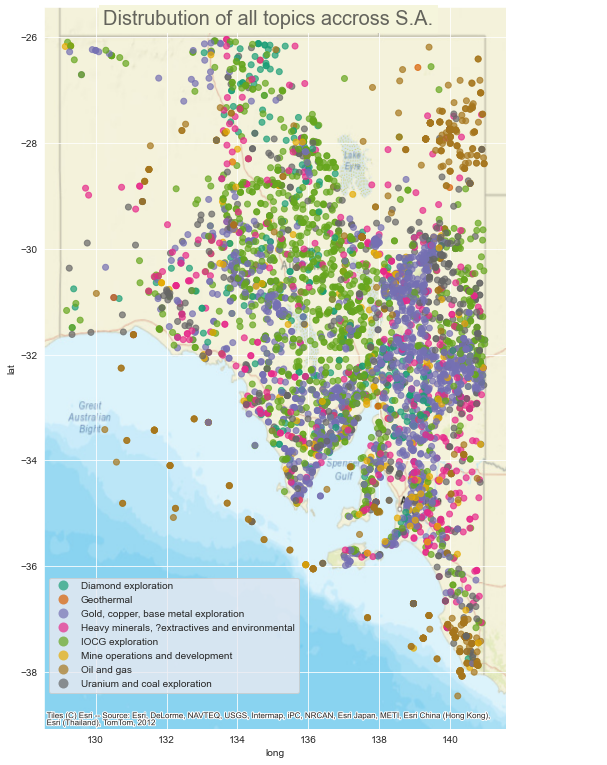

In [269]:
fig_1, ax_1 = plt.subplots(figsize=(8.27,11.69))
all_tenement_topics_nodup_gdf.plot(column='Topic_Name', ax=ax_1, alpha=0.7, legend=True, legend_kwds={'loc':(0.01,0.05)}, cmap='Dark2')
ctx.add_basemap(ax_1, crs=all_tenement_topics_nodup_gdf.crs.to_string(), source=ctx.providers.Esri.WorldStreetMap, aspect='auto')
fig_1.subplots_adjust(top=0.983)
fig_1.suptitle("Distrubution of all topics accross S.A.", fontsize=20, backgroundcolor='beige', alpha=0.7)
plt.xlabel("long")
plt.ylabel("lat")

plt.savefig(r"D:\Python ML\Envelope-key-words\Notebooks\Abstract LDA\Figures\Dist_all_topics.png", bbox_inches='tight')
plt.show()

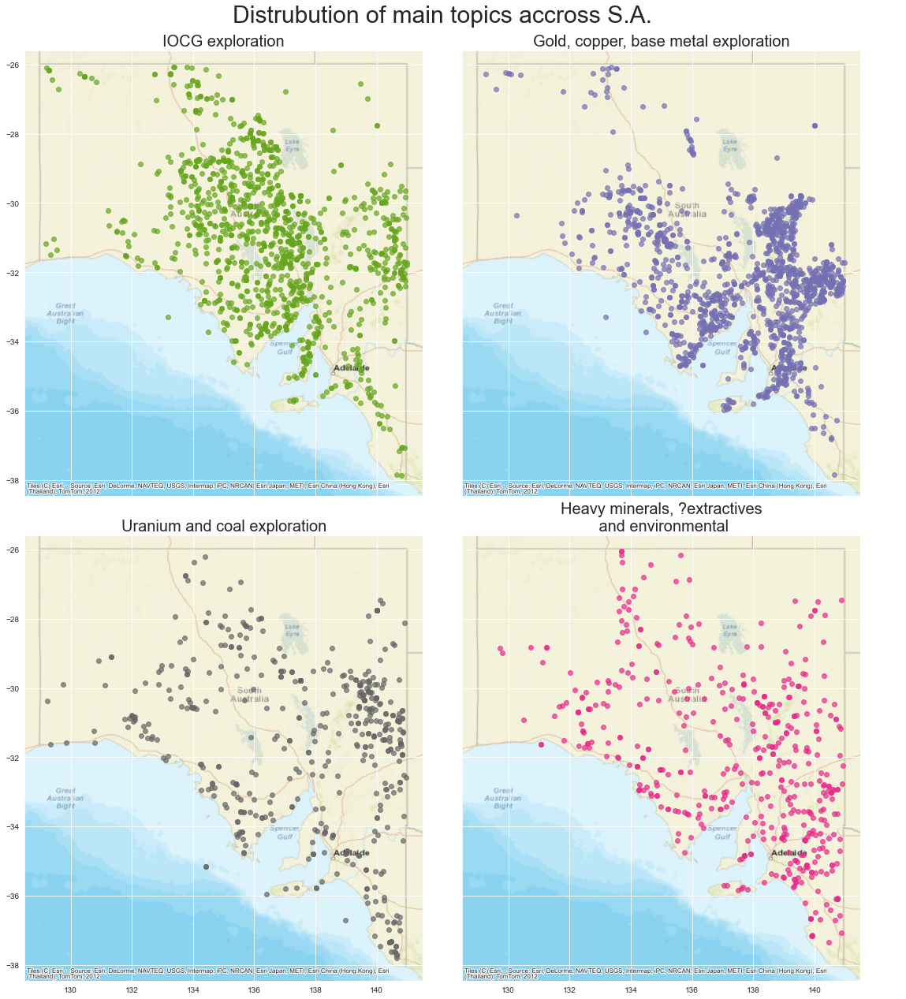

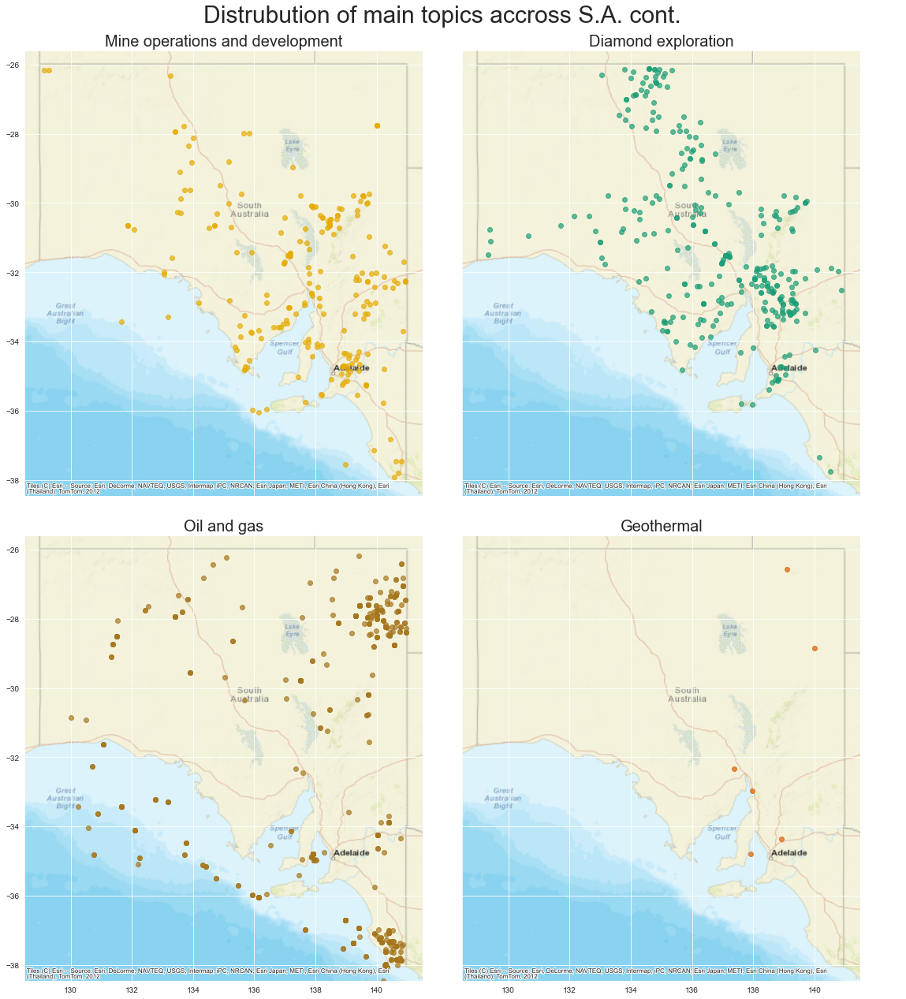

In [270]:

fig2, ax2 = plt.subplots(2,2, figsize=(18.4,20.1), sharex=True, sharey=True, gridspec_kw={'wspace':0.1, 'hspace':0.09})
for r in range(2):
    for c in range(2):
        ax2[r,c].set_xlim(128.5,141.5)
        ax2[r,c].set_ylim(-38.456,-25.6)
iocg.plot(column='Topic_Name', ax=ax2[0,0], alpha=0.7, color= '#66A61E' )
ax2[0,0].set_title("IOCG exploration", fontsize=20)
base.plot(column='Topic_Name', ax=ax2[0,1], alpha=0.7, color='#7570B3')
ax2[0,1].set_title('Gold, copper, base metal exploration', fontsize=20)
uranium.plot(column='Topic_Name', ax=ax2[1,0], alpha=0.7, color='#666666')
ax2[1,0].set_title('Uranium and coal exploration', fontsize=20)
hm.plot(column='Topic_Name', ax=ax2[1,1], alpha=0.7, color='#E7298A')
ax2[1,1].set_title('Heavy minerals, ?extractives\n and environmental', fontsize=20)
for r in range(2):
    for c in range(2):
        ctx.add_basemap(ax2[r,c], crs=all_tenement_topics_nodup_gdf.crs.to_string(), source=ctx.providers.Esri.WorldStreetMap, aspect='auto')
fig2.subplots_adjust(top=0.94, left=0.1)
fig2.suptitle("Distrubution of main topics accross S.A.", fontsize=30)
plt.savefig(r"D:\Python ML\Envelope-key-words\Notebooks\Abstract LDA\Figures\topic_dist_plot_2a.png",dpi=200, bbox_inches='tight')
plt.show()

fig2b, ax2b = plt.subplots(2,2, figsize=(18.4,20.1), sharex=True, sharey=True, gridspec_kw={'wspace':0.1, 'hspace':0.09})
for r in range(2):
    for c in range(2):
        ax2b[r,c].set_xlim(128.5,141.5)
        ax2b[r,c].set_ylim(-38.456,-25.6)

mines.plot(column='Topic_Name', ax=ax2b[0,0], alpha=0.7, color='#E6AB02')
ax2b[0,0].set_title('Mine operations and development', fontsize=20)
diamond.plot(column='Topic_Name', ax=ax2b[0,1], alpha=0.7, color='#1B9E77')
ax2b[0,1].set_title('Diamond exploration', fontsize=20)
oil.plot(column='Topic_Name', ax=ax2b[1,0], alpha=0.7, color='#A6761D')
ax2b[1,0].set_title('Oil and gas', fontsize=20)
geotherm.plot(column='Topic_Name', ax=ax2b[1,1], alpha=0.7, color='#D95F02')
ax2b[1,1].set_title('Geothermal', fontsize=20)
for r in range(2):
    for c in range(2):
        ctx.add_basemap(ax2b[r,c], crs=all_tenement_topics_nodup_gdf.crs.to_string(), source=ctx.providers.Esri.WorldStreetMap, aspect='auto')
fig2b.subplots_adjust(top=0.94, left=0.1)
fig2b.suptitle("Distrubution of main topics accross S.A. cont.", fontsize=30)
plt.tight_layout()
plt.savefig(r"D:\Python ML\Envelope-key-words\Notebooks\Abstract LDA\Figures\topic_dist_plot_2b.png",dpi=200, bbox_inches='tight')
plt.show()


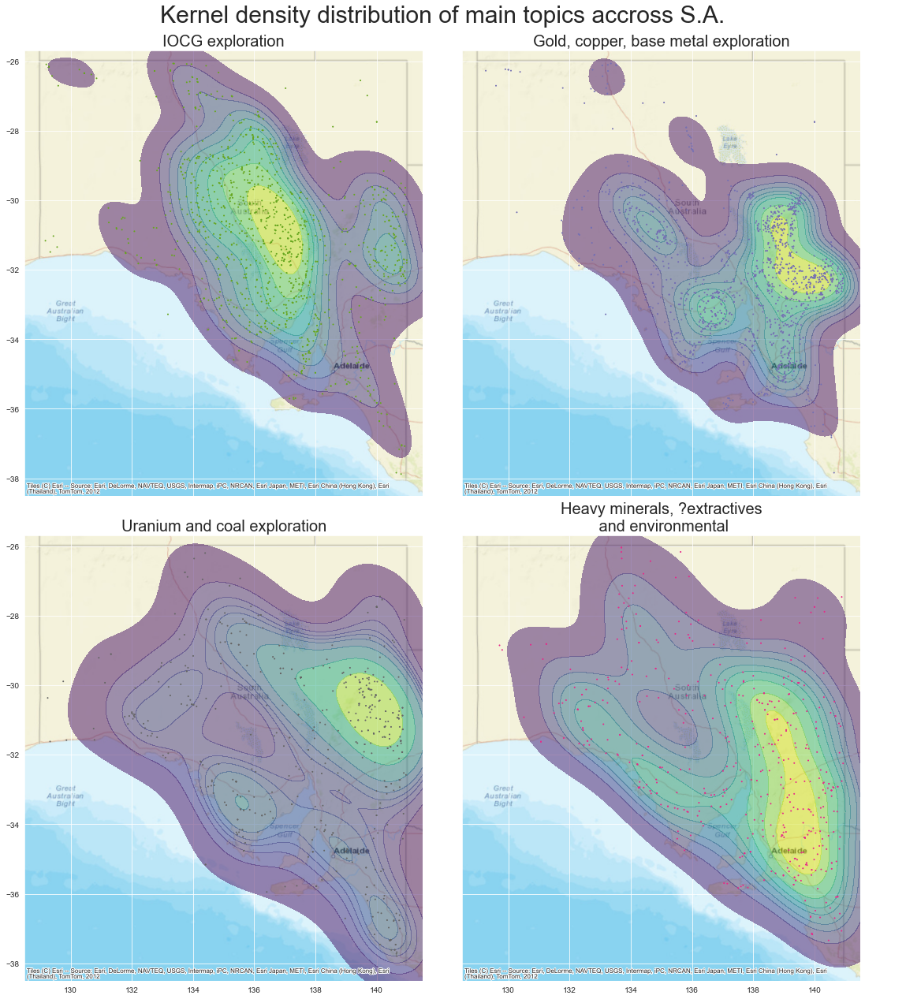

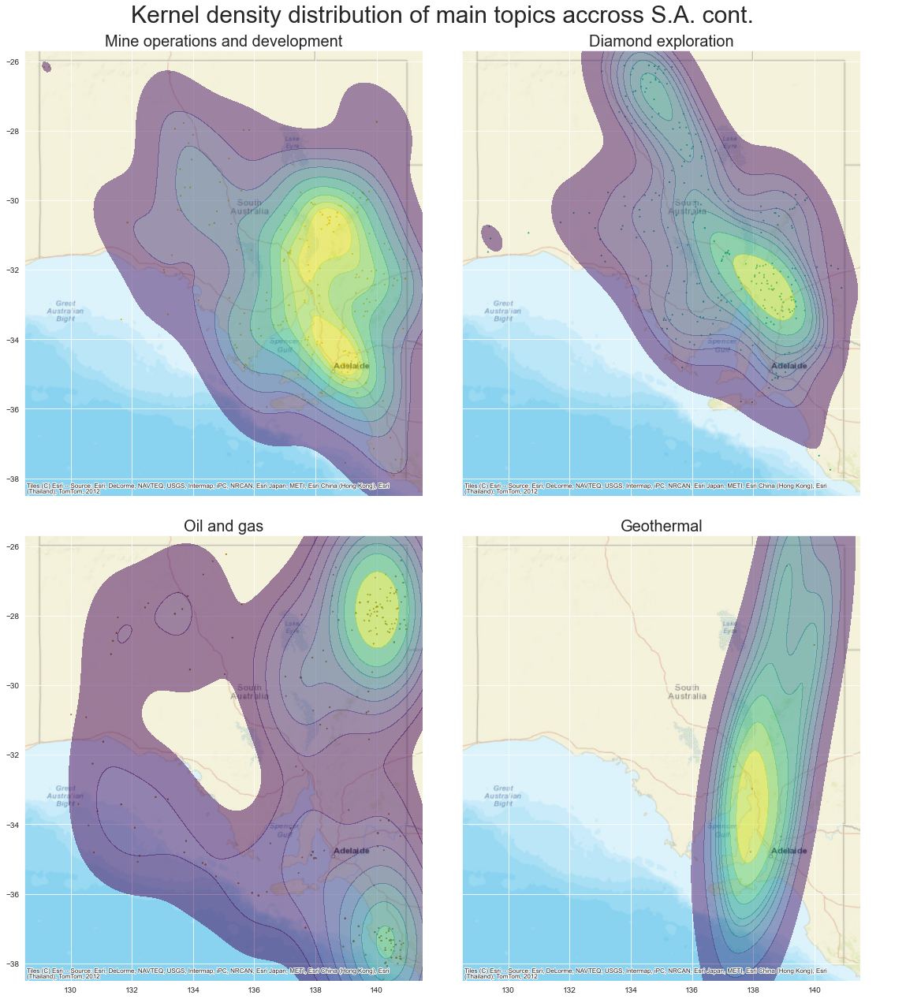

In [271]:
extent= (128.5, -38.5, 141.5, -25.7)

fig3, ax3 = plt.subplots(2,2, figsize=(18.4,20.1), sharex=True, sharey=True, gridspec_kw={'wspace':0.1, 'hspace':0.09})

for r in range(2):
    for c in range(2):
        ax3[r,c].set_xlim(128.5,141.5)
        ax3[r,c].set_ylim(-38.456,-25.6)
gplt.kdeplot(iocg, ax=ax3[0,0], cmap='viridis', shade=True, alpha=0.5)
gplt.pointplot(iocg, ax=ax3[0,0], s=1, color= '#66A61E')
ax3[0,0].set_title("IOCG exploration", fontsize=20)
gplt.kdeplot(base, ax=ax3[0,1], cmap='viridis', shade=True, alpha=0.5)
gplt.pointplot(base, ax=ax3[0,1],s=1, color='#7570B3' )
ax3[0,1].set_title('Gold, copper, base metal exploration', fontsize=20)
gplt.kdeplot(uranium, ax=ax3[1,0], cmap='viridis', shade=True, alpha=0.5)
gplt.pointplot(uranium, ax=ax3[1,0],s=1, color='#666666')
ax3[1,0].set_title('Uranium and coal exploration', fontsize=20)
gplt.kdeplot(hm, ax=ax3[1,1], cmap='viridis', shade=True, alpha=0.5)
gplt.pointplot(hm, extent=extent, ax=ax3[1,1],s=1, color='#E7298A')
ax3[1,1].set_title('Heavy minerals, ?extractives\n and environmental', fontsize=20)
for r in range(2):
    for c in range(2):
        ctx.add_basemap(ax3[r,c], crs=all_tenement_topics_nodup_gdf.crs.to_string(), source=ctx.providers.Esri.WorldStreetMap, aspect='auto')
        ax3[r,c].axison=True
fig3.subplots_adjust(top=0.94, left=0.1)
fig3.suptitle("Kernel density distribution of main topics accross S.A.", fontsize=30)
plt.tight_layout()
plt.savefig(r"D:\Python ML\Envelope-key-words\Notebooks\Abstract LDA\Figures\kde_topic_dist_plot_3a.png", bbox_inches='tight')
plt.show()


fig3b, ax3b = plt.subplots(2,2, figsize=(18.4,20.1), sharex=True, sharey=True, gridspec_kw={'wspace':0.1, 'hspace':0.09})
for r in range(2):
    for c in range(2):
        ax3b[r,c].set(xlim=(128.5,141.5), ylim=(-38.456,-25.6))

gplt.pointplot(mines,extent=extent, ax=ax3b[0,0], s=1, color='#E6AB02')
gplt.kdeplot(mines,extent=extent, ax=ax3b[0,0], cmap='viridis', shade=True, alpha=0.5)
ax3b[0,0].set_title('Mine operations and development', fontsize=20)
gplt.pointplot(diamond, ax=ax3b[0,1], s=1, color='#1B9E77')
gplt.kdeplot(diamond, ax=ax3b[0,1], cmap='viridis', shade=True, alpha=0.5)
ax3b[0,1].set_title('Diamond exploration', fontsize=20)
gplt.pointplot(oil, ax=ax3b[1,0], s=1, color='#A6761D')
gplt.kdeplot(oil, ax=ax3b[1,0], cmap='viridis', shade=True, alpha=0.5)
ax3b[1,0].set_title('Oil and gas', fontsize=20)
gplt.pointplot(geotherm, ax=ax3b[1,1], s=1, color='#D95F02')
gplt.kdeplot(geotherm, extent=extent, ax=ax3b[1,1], cmap='viridis', shade=True, alpha=0.5)
ax3b[1,1].set_title('Geothermal', fontsize=20)

for r in range(2):
    for c in range(2):
        ctx.add_basemap(ax3b[r,c], crs=all_tenement_topics_nodup_gdf.crs.to_string(), source=ctx.providers.Esri.WorldStreetMap, aspect='auto')
        ax3b[r,c].axison=True

fig3b.subplots_adjust(top=0.94, left=0.1)
fig3b.suptitle("Kernel density distribution of main topics accross S.A. cont.", fontsize=30)
#plt.tight_layout()
plt.savefig(r"D:\Python ML\Envelope-key-words\Notebooks\Abstract LDA\Figures\kde_topic_dist_plot_3b.png", bbox_inches='tight')
plt.show()